In [7]:
os.listdir('/kaggle/input/microsoft-catsvsdogs-dataset')


['PetImages', 'readme[1].txt', 'MSR-LA - 3467.docx']

In [24]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/microsoft-catsvsdogs-dataset/readme[1].txt
/kaggle/input/microsoft-catsvsdogs-dataset/MSR-LA - 3467.docx
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/7981.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/6234.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/1269.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/3863.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/6241.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/10304.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/623.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/2193.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/11925.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/3750.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/11378.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/2008.jpg
/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/10730.jpg
/kaggle/input/micros

In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import tqdm #provides a fast, extensible progress bar for loops in Python. It displays real-time progress, estimated time remaining, and loop iteration speed
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')
import seaborn as sns

### Create dataframe for input and output 

In [28]:
input_path = []
label = []

base_path = "/kaggle/input/microsoft-catsvsdogs-dataset/PetImages"

for class_name in os.listdir(base_path):
    for path in os.listdir(os.path.join(base_path,class_name)):
        
        if(class_name == 'Cat'):
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join(base_path, class_name ,path))

print(input_path[12],label[0])

/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/10730.jpg 1


In [9]:
df = pd.DataFrame() #creates a 2-dimensional, size-mutable, labeled data structure(table) in pandas
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop = True)
df.head(10)

,images,label
0,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
1,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
2,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
3,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
4,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
5,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
6,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
7,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
8,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
9,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0


In [29]:
df.shape

(24998, 2)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24998 entries, 0 to 24997
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   images  24998 non-null  object
 1   label   24998 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 390.7+ KB


In [31]:
# delete db files
for i in df['images']:
    if '.jpg' not in i :
        print(i)


df = df[df['images'] != '/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Cat/Thumbs.db'] 
df = df[df['images'] != '/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/Thumbs.db'] 
len(df)

24998

In [32]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)

l

[]

In [33]:
# delete corrupt images , whichbdon't open

# df = df[df['images'] != '/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Cat/666.jpg'] 
# df = df[df['images'] != '/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/11702.jpg'] 
# len(df)

from PIL import Image

valid_images = []
valid_labels = []

for i, path in enumerate(df['images']):
    try:
        img = Image.open(path)
        img.verify()
        valid_images.append(path)
        valid_labels.append(df['label'].iloc[i])
    except:
        continue

df = pd.DataFrame({'images': valid_images, 'label': valid_labels})


In [34]:
df.shape

(24998, 2)

In [ ]:
# df['images'] = df['images'].str.replace('/kaggle/input/microsoft-catsvsdogs-dataset/','', regex = False)

##Exploratory Data Analysis

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt

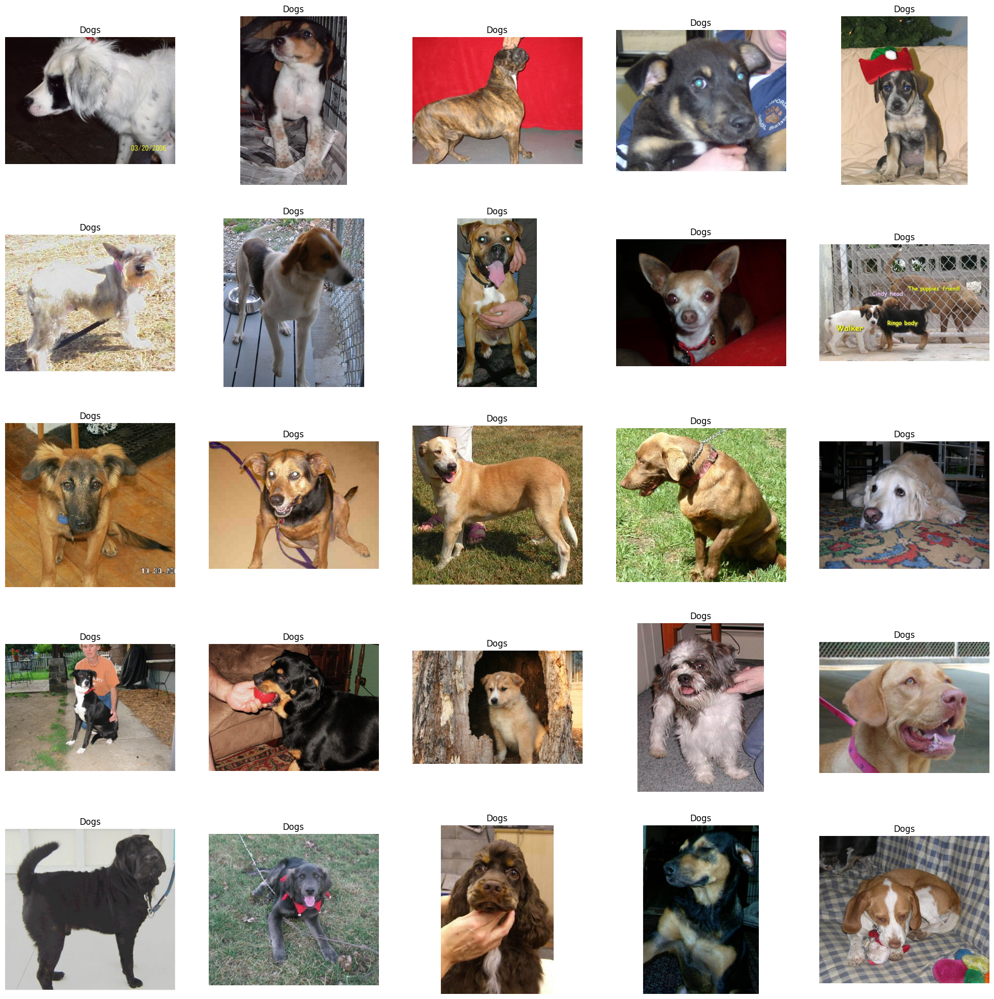

In [35]:
# to display grid of images
plt.figure(figsize = (25,25))
temp = df[df['label'] == 1]['images']

start = random.randint(0,len(temp))
files = temp[start : start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img) # converting image to array
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

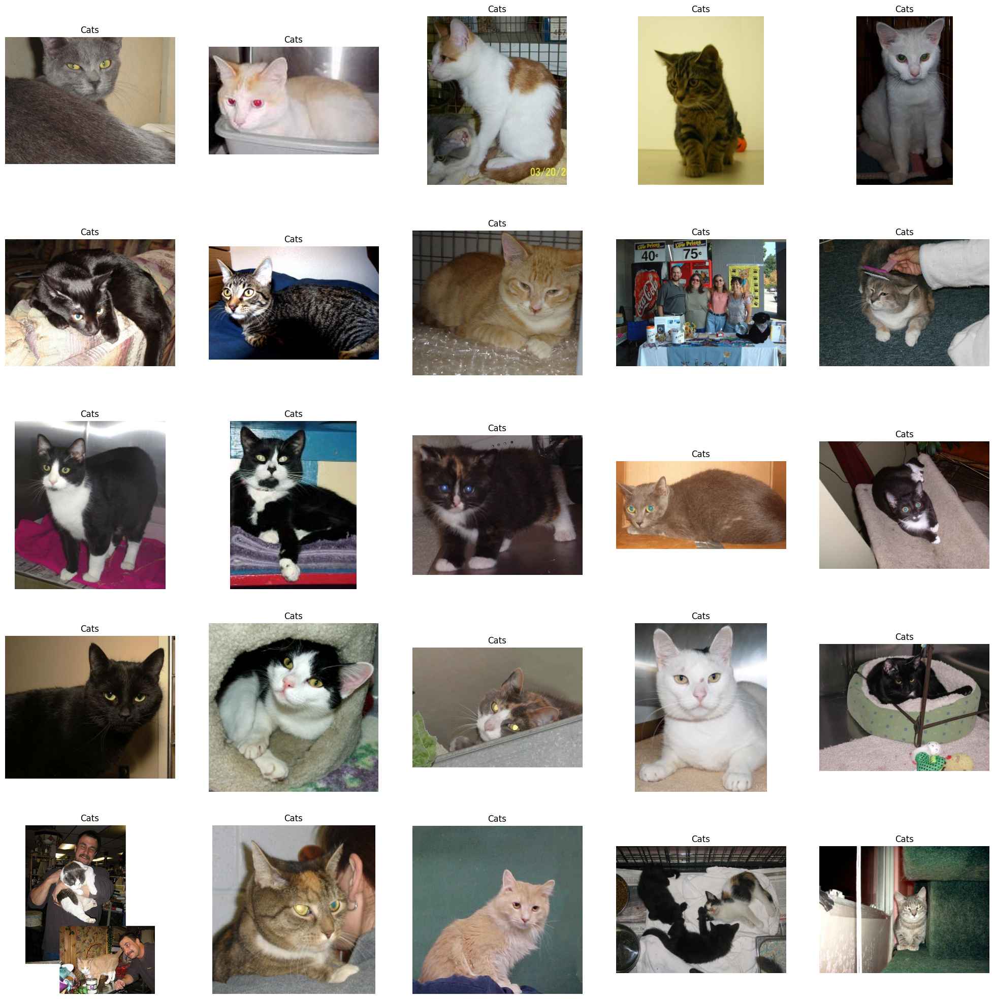

In [36]:
plt.figure(figsize = (25,25))
temp = df[df['label'] == 0]['images']

start = random.randint(0,len(temp))
files = temp[start : start+25]

for index, file in enumerate(files):
    plt.subplot(5,5,index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: xlabel='label', ylabel='count'>

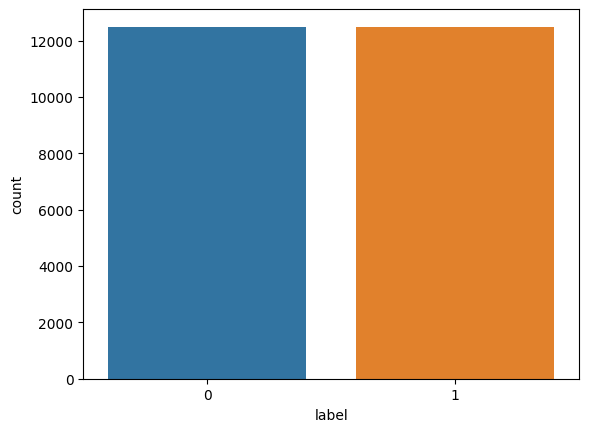

In [37]:
import seaborn as sns
sns.countplot(x = df['label'])

## Create DataGenerator for the Images

In [38]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense, Input, Conv2D, MaxPooling2D, Flatten, BatchNormalization, Dropout


In [ ]:
# CampusX 

# generators
# train_ds = keras.utils.Image_dataset_from_directory(
#     directory = '/kaggle/input/microsoft-catsvsdogs-dataset/PetImages',
#     labels = 'inferred', 
#     label_mode = 'int',
#     batch_size = 32,
#     image_size = (256,256)
# )

In [39]:
# youtube wala
df['label'] = df['label'].astype('str')

In [40]:
#input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df,test_size = 0.2, random_state = 42)

In [41]:
test.head()

,images,label
6868,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
22910,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
9668,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
13638,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
23337,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1


In [42]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255, # normalization for images
    rotation_range = 40, # augmentation of image to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)


train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col = 'images',
    y_col = 'label',
    target_size = (128,128),
    batch_size = 64,
    class_mode = 'binary',
    validate_filenames = False
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col = 'images',
    y_col = 'label',
    target_size = (128,128),
    batch_size = 64,
    class_mode = 'binary',
    validate_filenames = False
)

Found 19998 non-validated image filenames belonging to 2 classes.
Found 5000 non-validated image filenames belonging to 2 classes.


In [43]:
print(train_iterator.samples)
print(val_iterator.samples)

19998
5000


## Model Creation


In [46]:
model = Sequential()
model.add(Input(shape = (128,128,3)))
model.add(Conv2D(16, (3,3) , activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), strides = 2, padding = 'valid'))

model.add(Conv2D(32,(3,3), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), strides = 2, padding = 'valid'))

model.add(Conv2D(12,(3,3), activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2), strides = 2, padding = 'valid'))

model.add(Flatten())


model.add(Dense(128,activation = 'relu'))
model.add(Dropout(0.1))

model.add(Dense(64,activation = 'relu'))
model.add(Dropout(0.1))

model.add(Dense(1,activation = 'sigmoid'))

In [47]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 126, 126, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 61, 61, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 28, 28, 12)          │           3,468 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 28, 28, 12)          │              48 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 14, 14, 12)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 2352)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │         301,184 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 318,301 (1.21 MB)

 Trainable params: 318,181 (1.21 MB)

 Non-trainable params: 120 (480.00 B)

In [ ]:
history = model.fit(train_iterator, epochs = 12, validation_data = val_iterator)

Epoch 1/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 143s 456ms/step - accuracy: 0.6363 - loss: 0.6465 - val_accuracy: 0.5598 - val_loss: 0.7702
Epoch 2/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 118s 376ms/step - accuracy: 0.7070 - loss: 0.5576 - val_accuracy: 0.7042 - val_loss: 0.6507
Epoch 3/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 116s 371ms/step - accuracy: 0.7484 - loss: 0.5058 - val_accuracy: 0.7664 - val_loss: 0.4786
Epoch 4/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 115s 366ms/step - accuracy: 0.7704 - loss: 0.4716 - val_accuracy: 0.7522 - val_loss: 0.5340
Epoch 5/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 114s 365ms/step - accuracy: 0.7864 - loss: 0.4487 - val_accuracy: 0.7822 - val_loss: 0.4581
Epoch 6/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 115s 367ms/step - accuracy: 0.7970 - loss: 0.4342 - val_accuracy: 0.8264 - val_loss: 0.3990
Epoch 7/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 114s 365ms/step - accuracy: 0.8122 - loss: 0.4103 - val_accuracy: 0.8322 - val_loss: 0.3780
Epoch 8/12
313/313 ━━━━━━━━━━━━━━━━━━━━ 114s 365ms/step - accuracy: 0.8261 -

## Visualization of the result

<Figure size 640x480 with 0 Axes>

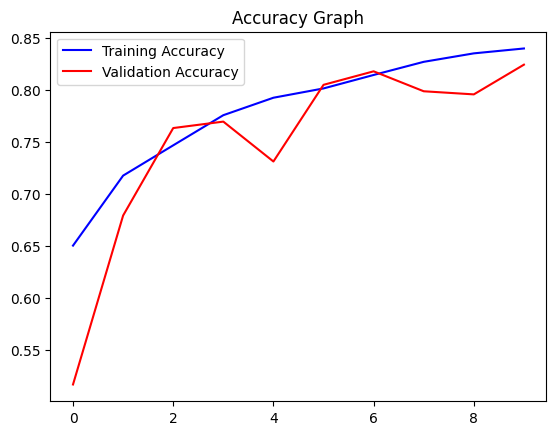

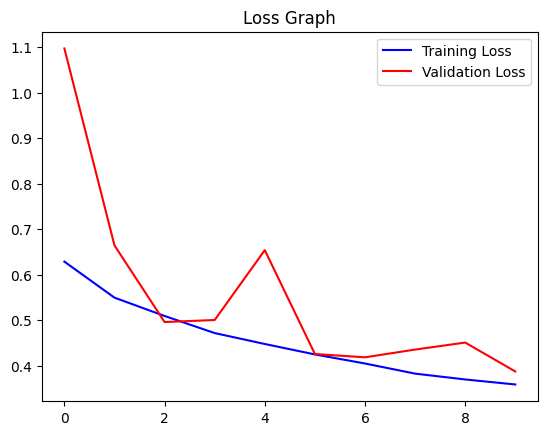

<Figure size 640x480 with 0 Axes>

In [44]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc,'b', label = 'Training Accuracy')
plt.plot(epochs, val_acc, 'r' , label = 'Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs, loss,'b', label = 'Training Loss')
plt.plot(epochs, val_loss, 'r' , label = 'Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.figure()


### Ways to reduce overfitting

1. Add more data
2. Data Augmentation
3. L1/L2 Regularization
4. Dropout
5. Batch Norm
6. Reduce Complexity